<a href="https://colab.research.google.com/github/hamdjalil/ChordDiagram/blob/master/22100083_partA_PA1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## CS436/5310/EE513 - Fall 2021 - Part A

#### Important Instructions and Submission Guidelines:
- Naming convention for submission of this notebook is `RollNumber_partA_PA1.ipynb` where. For example: `22100075_partA_PA1.ipynb`
- All the cells <b>must</b> be run once before submission. If your submission's cells are not showing the results (plots etc.), marks wil be deducted
- Only the code written within this notebook's marked areas will be considered while grading. No other files will be entertained
- You are advised to follow good programming practies including approriate variable naming and making use of logical comments 


The university honor code should be maintained. Any violation, if found, will result in disciplinary action. 


<b>Double click here to enter your name and roll number:  
Name: 

Roll Number: 
</b>

#### Overview

In Part A, you will be implementing convolution from scratch to get a hands-on experience of how it works. You will be implementing the following functions from scratch:
- Zero padding
- Convolution operation

Further details of the tasks are provided below.

In [1]:
# making all the necessary imports here
import numpy as np
import cv2
import matplotlib.pyplot as plt
from scipy.spatial import distance
from google.colab.patches import cv2_imshow
# you may include more libraries here if needed

#### Zero-Padding

Zero-padding adds zeros around the border of an image:

The main benefits of padding are the following:

- It allows you to use a CONV layer without necessarily shrinking the height and width of the volumes. This is important for building deeper networks, since otherwise the height/width would shrink as you go to deeper layers. An important special case is the "same" convolution, in which the height/width is exactly preserved after one layer. 

- It helps us keep more of the information at the border of an image. Without padding, very few values at the next layer would be affected by pixels as the edges of an image.


Implement the <code>zero_pad</code> function which will pad the image. Use <code>np.pad</code> to do this (Look up the documentation to figure out the arguments for padding)

In [2]:
def zero_pad(X, pad):
    """
    Arguments:
    X -- python numpy array of shape (n_H, n_W) representing a an image
    pad -- integer, amount of padding around each image on vertical and horizontal dimensions
    """

    ### Code Here ###
    X_pad = np.pad(X, ((pad,pad),(pad,pad)),'constant')
    

    #################

    return X_pad

Shape of x_pad:  (7, 7)


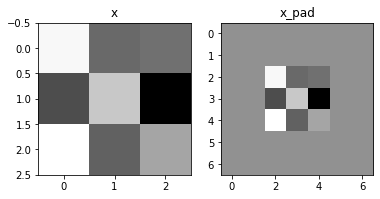

In [3]:
# visualizing the zero_pad's fucntion's output
np.random.seed(1)
x = np.random.randn(3, 3)
x_pad = zero_pad(x, 2)
print("Shape of x_pad: ", x_pad.shape)
fig, axarr = plt.subplots(1, 2)
axarr[0].set_title('x')
axarr[0].imshow(x,cmap='gray')
axarr[1].set_title('x_pad')
axarr[1].imshow(x_pad,cmap='gray')

#### 2D Convolution

2D covolution is the process of applying a filter to an image. Implement the <code>conv2D</code> function that will be used to build a convolutional unit which:

- Takes an input image 
- Applies a filter keeping as per padding and stride parameters 
- Outputs another image (usually, but not necessarily, of different size)

In [4]:
def conv2D(inp, F, pad, stride):
    """
    Arguments:
    inp -- output activations of the previous layer (can also be conceptualized as the input image), numpy array of shape (n_H, n_W)
    F -- Filter, numpy array of shape (f, f)
    pad -- integer
    stride -- integer
    """

    conv_output = None

    ### Code Here ###
    ( n_H_prev, n_W_prev) = inp.shape
    (f,f) = F.shape

    n_H = int(((n_H_prev + 2*pad - f)/stride) + 1) 
    n_W = int(((n_W_prev + 2*pad - f)/stride) + 1) 

    Z = np.zeros((n_H,n_W))

    inp = zero_pad(inp, pad)

  

    # for i in range(inp.shape[1]):
    # counter = 0
    # while i < inp.shape[1]:
    #       inp_slice = inp[i + f,i+ f]
    #       res = np.sum( inp_slice* F)

    #       Z[h,w] = res
    #       i += stride



    r=0
    c=0
    r_z = 0
    c_z = 0
    
    while r+f < inp.shape[0]:
        while c+f < inp.shape[1]:

            inp_slice = inp[r:r+f, c:c+f]
            
            out = np.sum( inp_slice* F)
            #print(out)

            Z[r_z, c_z] = out

            c += stride
            c_z += 1
        
        r += stride
        c = 0
        
        r_z += 1
        c_z = 0







    
    #################

    return Z

#### Filter Banks

You have come across many different kinds of filters and various examples of them in the lectures. In the rest of the notebook, you will be experimenting with some of them. Some questions may require you to come up with your own filters as well

##### Reading Image(s)
You are required to do the following tasks:
- Use the above imported libraries to <b>read and display</b> image(s) provided to you with PA1's part A's "Images" folder. 
- You are required to apply various pre-processing techniques on the read image(s) to prepare them for edge detection tasks. This should be done keeping in mind that the task is of edge detection and not color detection
- Use the above imported libraries to <b>read and display</b> image provided to you with PA1's part A's "Target_Image" folder.

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [6]:
# read all the provided images "Images" folder in a list here
import os
input_images = []

### Code Here ###
for filename in os.listdir('/content/drive/MyDrive/CompVision/Images'):

  img = cv2.imread(os.path.join('/content/drive/MyDrive/CompVision/Images',filename))
  if img is not None:
      input_images.append(img)



#################

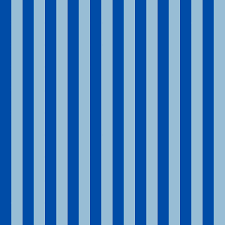

In [7]:
# display input_images[0] here

to_show = input_images[0]

### Code Here ###
cv2_imshow(to_show)


#################

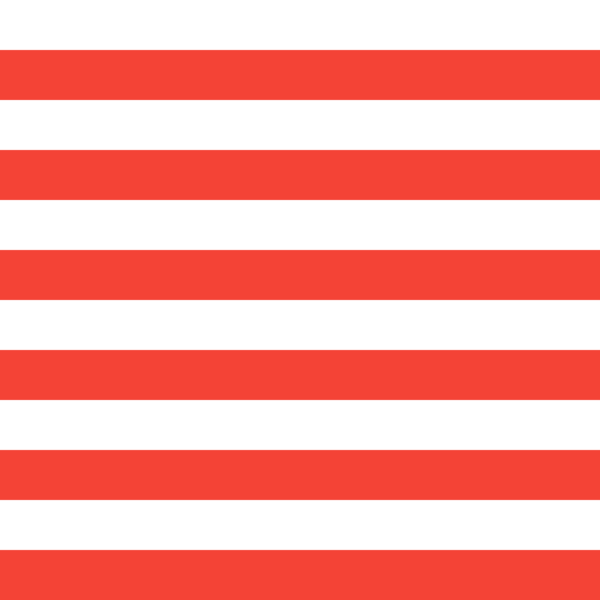

In [8]:
# display input_images[1] here

to_show = input_images[1]

### Code Here ###
cv2_imshow(to_show)



#################

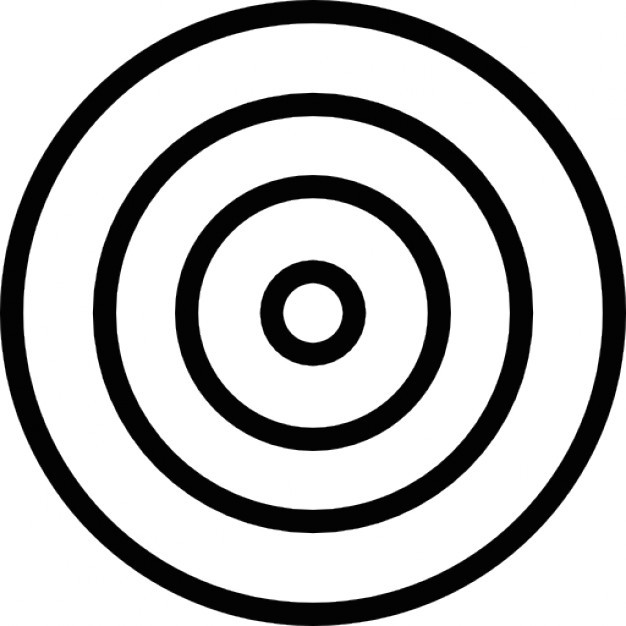

In [9]:
# display input_images[2] here

to_show = input_images[2]

### Code Here ###
cv2_imshow(to_show)



#################

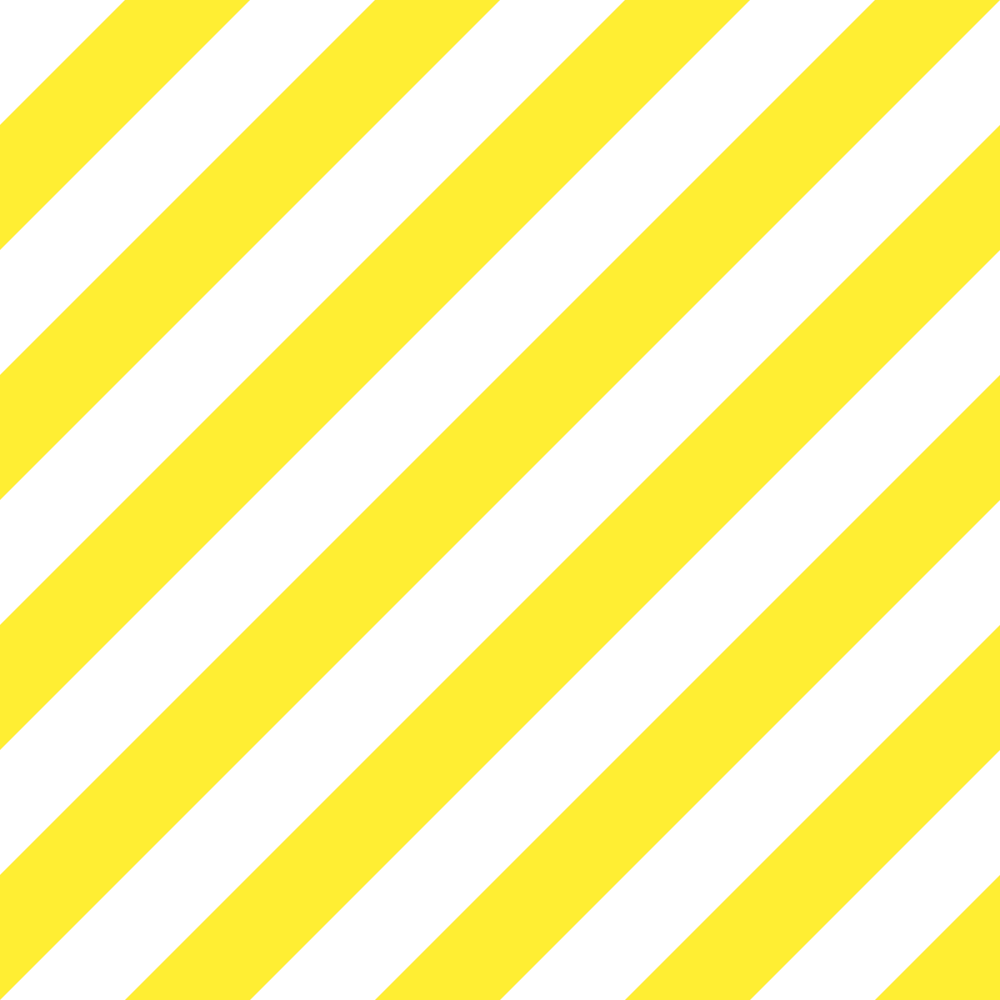

In [10]:
# display input_images[3] here

to_show = input_images[3]

### Code Here ###
cv2_imshow(to_show)



#################

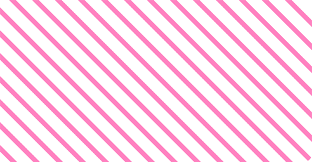

In [11]:
# display input_images[4] here

to_show = input_images[4]

### Code Here ###
cv2_imshow(to_show)



#################

In [12]:
# apply pre-processing on the read image(s) here

preprocessed_list_of_images = []

# or preprocessed_image = None

### Code Here ###
for image in input_images:
  print('Min: %.3f, Max: %.3f' % (image.min(), image.max()))

  image = image.astype('float32')
# normalize to the range 0-1
  image /= 255.0
  print('Min: %.3f, Max: %.3f' % (image.min(), image.max()))


  preprocessed_list_of_images.append(image)




#################

Min: 0.000, Max: 219.000
Min: 0.000, Max: 0.859
Min: 53.000, Max: 255.000
Min: 0.208, Max: 1.000
Min: 0.000, Max: 255.000
Min: 0.000, Max: 1.000
Min: 51.000, Max: 255.000
Min: 0.200, Max: 1.000
Min: 119.000, Max: 255.000
Min: 0.467, Max: 1.000


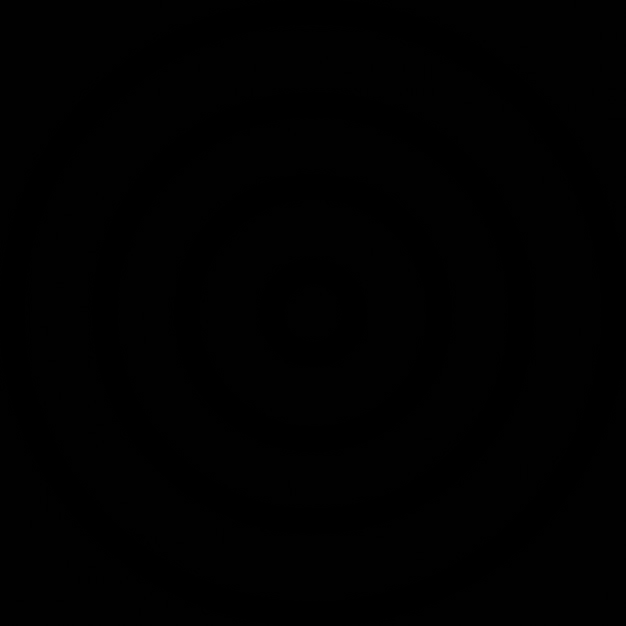

In [13]:
# display preprocessed_list_of_images[0] here

to_show = preprocessed_list_of_images[2]

### Code Here ###

cv2_imshow(to_show)


#################

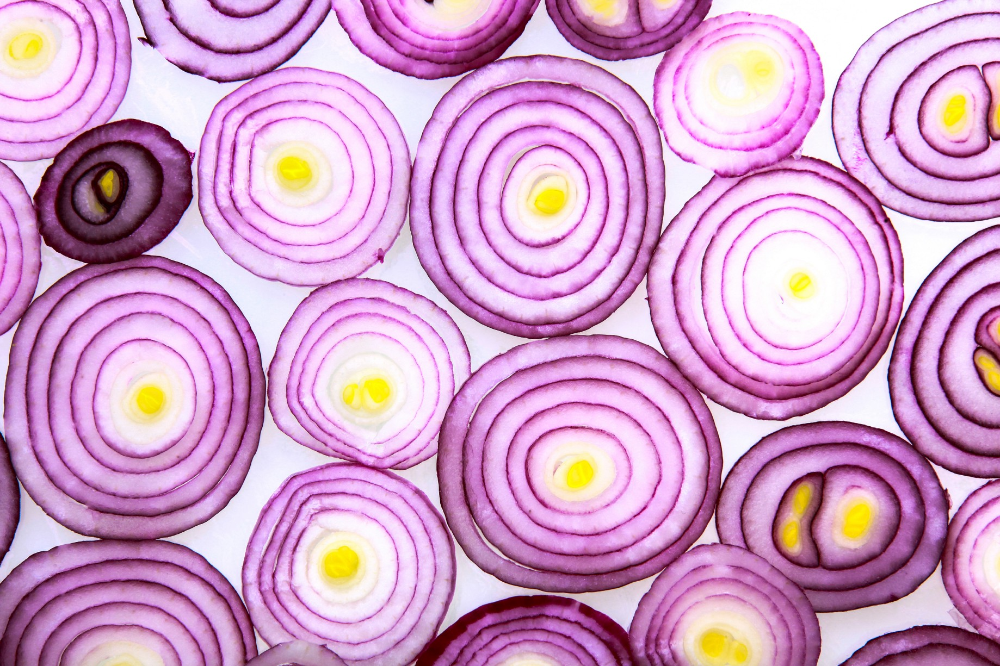

In [15]:
# read and display the provided image from "Target_Image" folder here

target_image = cv2.imread('/content/target.png')

### Code Here ###
cv2_imshow(target_image)



#################

##### Edge Detection Task

In this task, you will be interacting with all the images from the "Images" folder. Study the images to see how they are laid out before starting with the following tasks:
- Make a filter that gives a "high" activation on "horizontal.png"
- Make a filter that gives a "high" activation on "vertical.png"
- Make a filter that gives a "high" activation on "circular.png"
- Make a filter that gives a "high" activation on "right_to_left_diagonal.png"
- Make a filter that gives a "high" activation on "left_to_right_diagonal.png"

<b>Note:</b> You have to apply the filter using the <code>conv2D</code> function you made earlier. You must display each filter's result. If you fail to do so, 0 marks will be awarded for that part.  


(600, 600)
(600, 600)


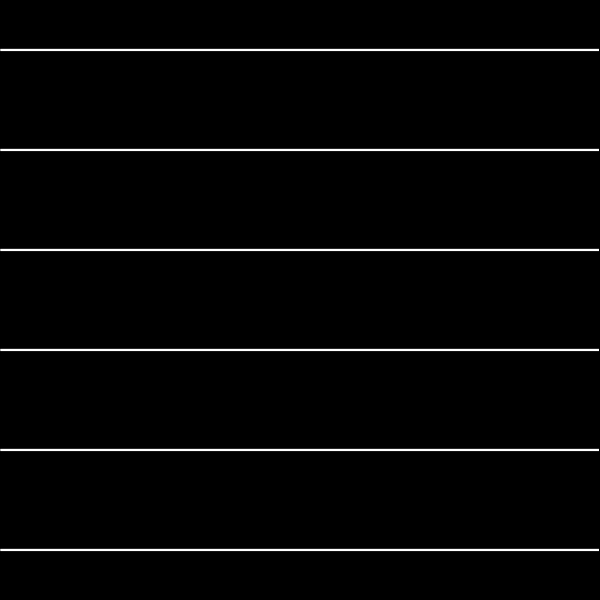

In [16]:
# initialize and apply horizontal edge detection filter on "horizontal.png" image and display result

h_filter = None

### Code Here ###

h_filter = np.array([[1, 1, 1], 
                     [0, 0, 0], 
                     [-1, -1, -1]])
duck_gray = cv2.imread('/content/drive/MyDrive/CompVision/Images/horizontal.png',cv2.IMREAD_GRAYSCALE)
                     

# Use your Conv2D filter to get horizontal edges and display them.
print(duck_gray.shape)
result = conv2D(duck_gray, h_filter, 1, 1)
print(result.shape)
cv2_imshow(result)


#################

(225, 225)
(225, 225)


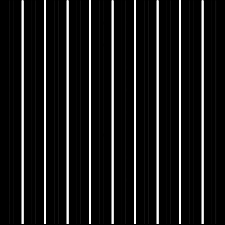

In [17]:
# initialize and apply vertical edge detection filter on "vertical.png" image and display result

v_filter = np.array([[1, 0, -1], 
                     [1, 0, -1], 
                     [1, 0, -1]])


### Code Here ###


duck_gray = cv2.imread('/content/drive/MyDrive/CompVision/Images/vertical.png',cv2.IMREAD_GRAYSCALE)
                     

# Use your Conv2D filter to get horizontal edges and display them.
print(duck_gray.shape)
result = conv2D(duck_gray, v_filter, 1, 1)
print(result.shape)
cv2_imshow(result)



#################

(626, 626)
(626, 626)


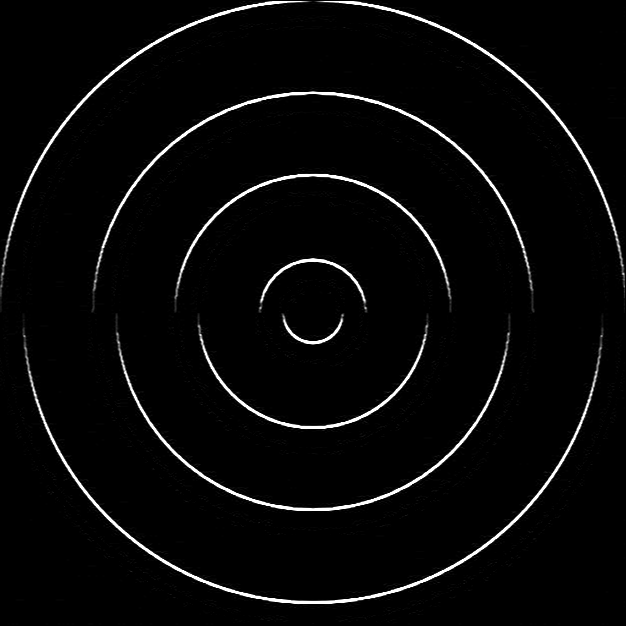

In [19]:
# initialize and apply circular pattern's edge detection filter on "circular.png" image and display result

c_filter_x = np.array([[1, 2, 1], 
                     [0, 0, 0], 
                     [-1, -2, -1]])



### Code Here ###


duck_gray = cv2.imread('/content/drive/MyDrive/CompVision/Images/circular.png',cv2.IMREAD_GRAYSCALE)
                     

# Use your Conv2D filter to get horizontal edges and display them.
print(duck_gray.shape)
result1 = conv2D(duck_gray, c_filter_x, 1, 1)
# result2 = conv2D(duck_gray, c_filter_y, 1, 1)
# result = result1 + result2

print(result1.shape)
cv2_imshow(result1)

#################

(1200, 1200)
(626, 626)


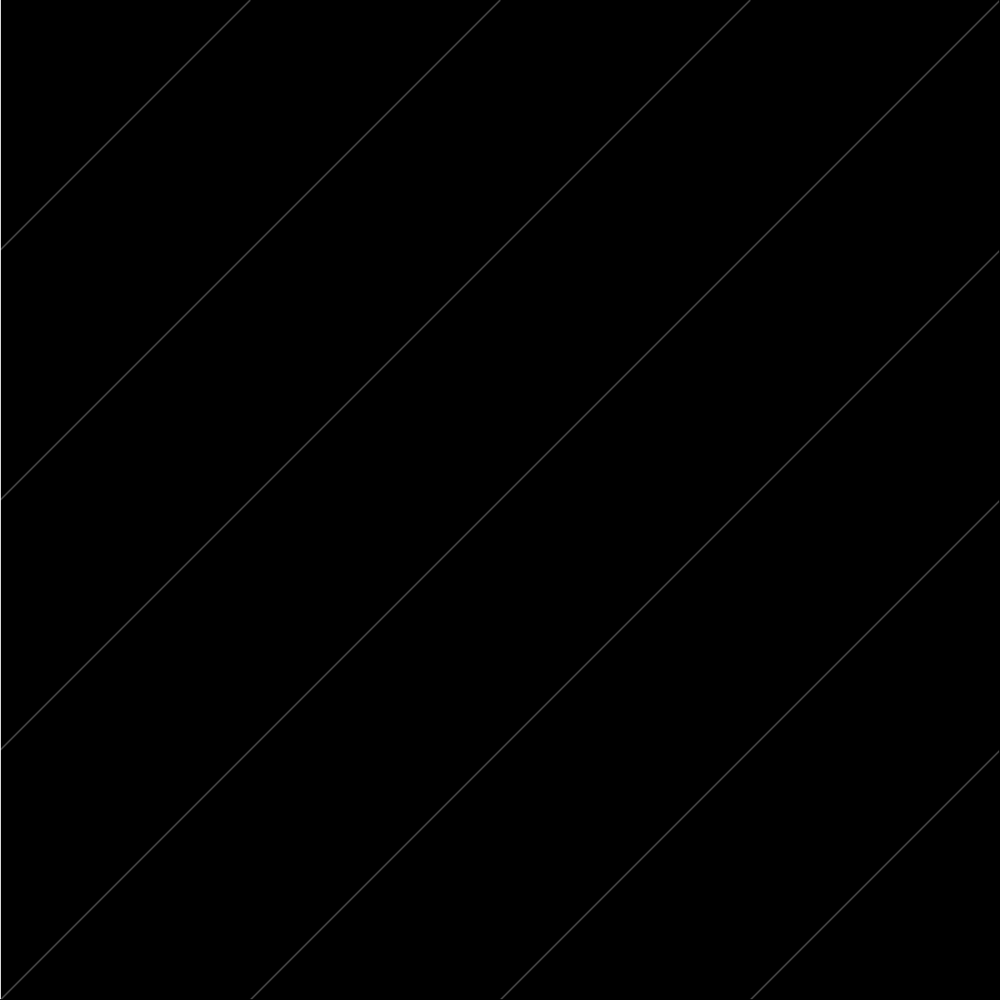

In [20]:
# initialize and apply right-to-left diagonal edge detection filter on "right_to_left_diagonal.png" image and display result

rlDiag_filter = np.array([[-1, 0, 1], 
                     [-2, 0, 2], 
                     [-1, 0, 1]])



### Code Here ###

duck_gray = cv2.imread('/content/drive/MyDrive/CompVision/Images/right_to_left_diagonal.png',cv2.IMREAD_GRAYSCALE)
                     

# Use your Conv2D filter to get horizontal edges and display them.
print(duck_gray.shape)
# result1 = conv2D(duck_gray, rlDiag_filter, 1, 1)
result2 = conv2D(duck_gray, c_filter_y, 1, 1)
# result = result1 + result2

print(result1.shape)
cv2_imshow(result2)



#################

(162, 312)


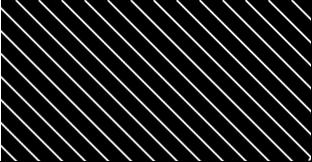

In [21]:
# initialize and apply left-to-right diagonal edge detection filter on "right_to_left_diagonal.png" image and display result

lrDiag_filter = np.array([[-1, 0, 1], 
                     [-2, 0, 2], 
                     [-1, 0, 1]])

### Code Here ###
duck_gray = cv2.imread('/content/drive/MyDrive/CompVision/Images/left_to_right_diagonal.png',cv2.IMREAD_GRAYSCALE)
                     

# Use your Conv2D filter to get horizontal edges and display them.
print(duck_gray.shape)
result = conv2D(duck_gray, lrDiag_filter, 1, 1)

cv2_imshow(result)



#################

#### Testing Your Filters Through Filter Banks

<b>Instructions:</b> In this part you will have to do the following:
- Apply all the filters made above to the target_image and store the results for each filter
- Use your results of filter application on preprocessed_list_of_images and calculate their euclidean distance from each detection in the stored results
- Analyze your results to determine the most dominant feature detected in the target_image and explain how your results show this

<b>Important (failing to follow these will result in mark's detection):</b> 
- Print the state of your variables at each stage
- Print any necessary image outputs
- Keep your code neat
- Add cells as required (DO NOT dump all the code in one cell)


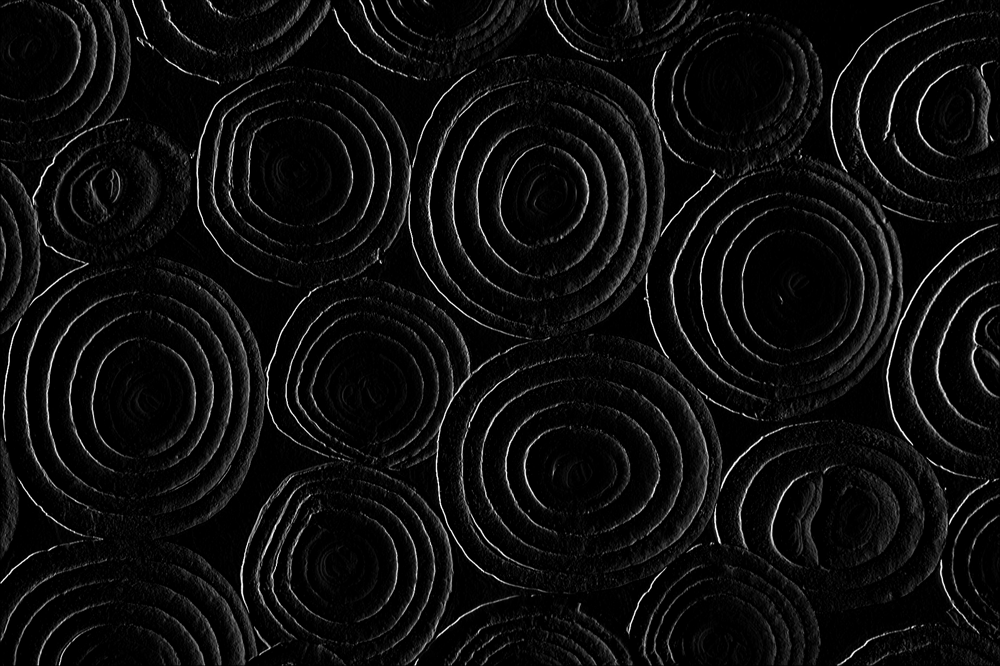

In [34]:
### Code Here ###
target_image = cv2.imread('/content/target.png',cv2.IMREAD_GRAYSCALE)
result = conv2D(target_image, v_filter, 1, 1)

cv2_imshow(result)


#################

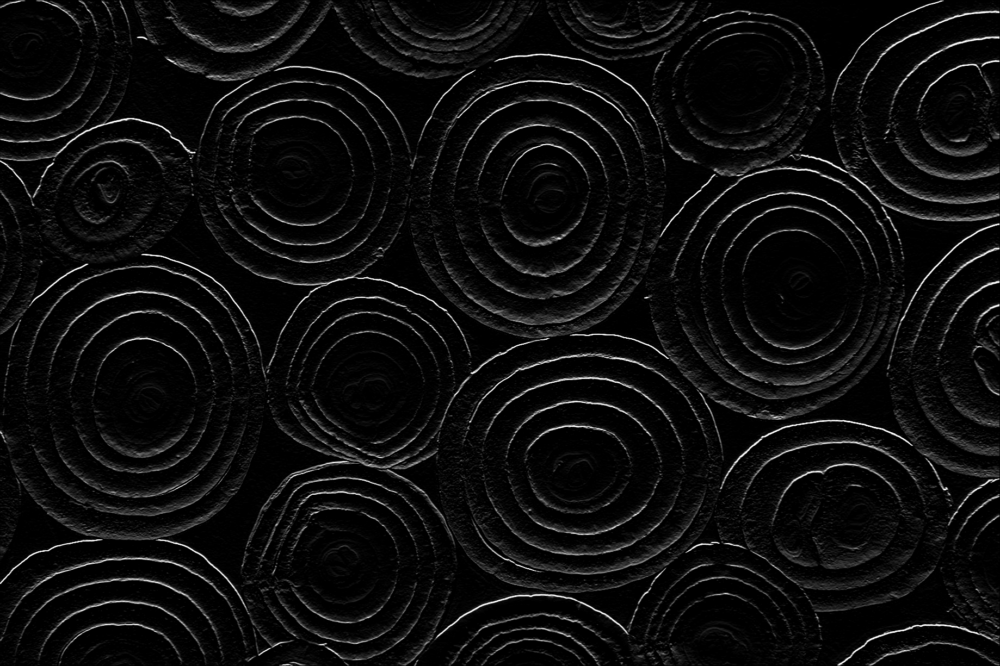

In [35]:
target_image = cv2.imread('/content/target.png',cv2.IMREAD_GRAYSCALE)
result = conv2D(target_image, h_filter, 1, 1)

cv2_imshow(result)

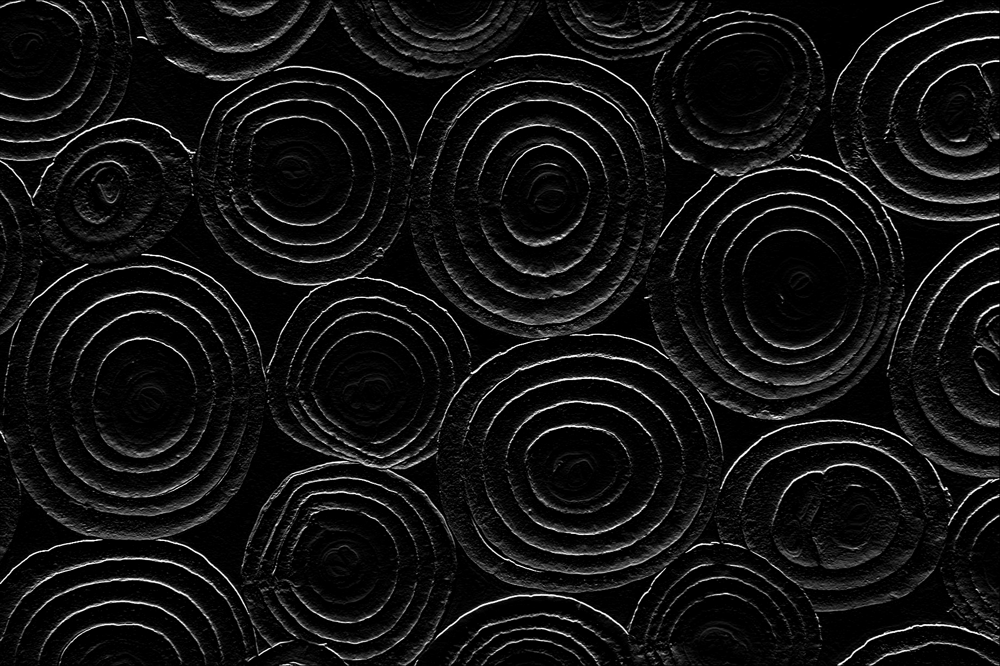

In [36]:
result = conv2D(target_image, c_filter_x, 1, 1)

cv2_imshow(result)

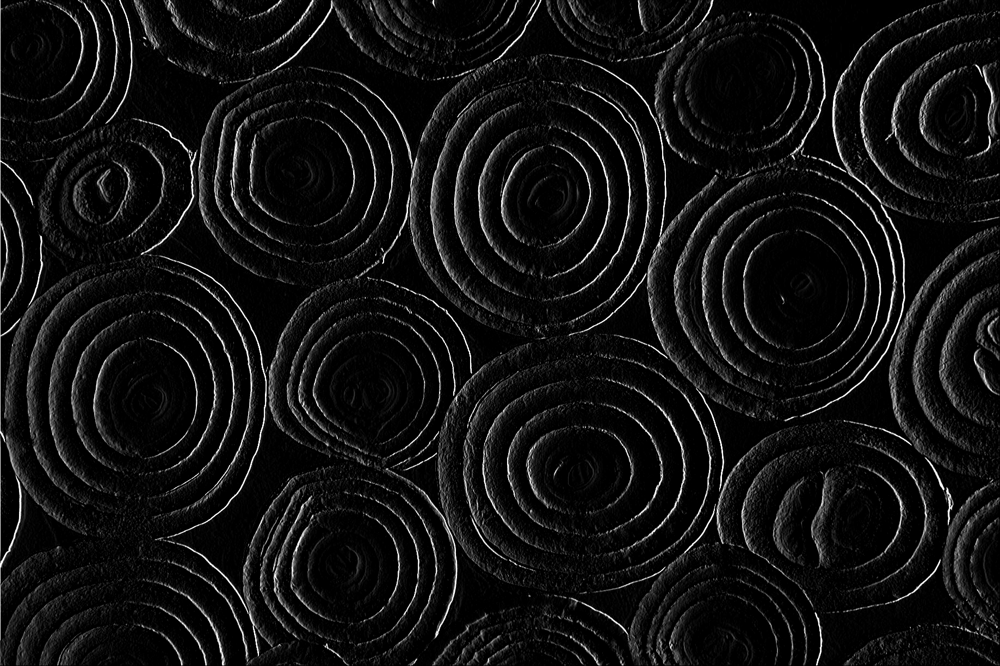

In [37]:
result = conv2D(target_image, rlDiag_filter, 1, 1)

cv2_imshow(result)

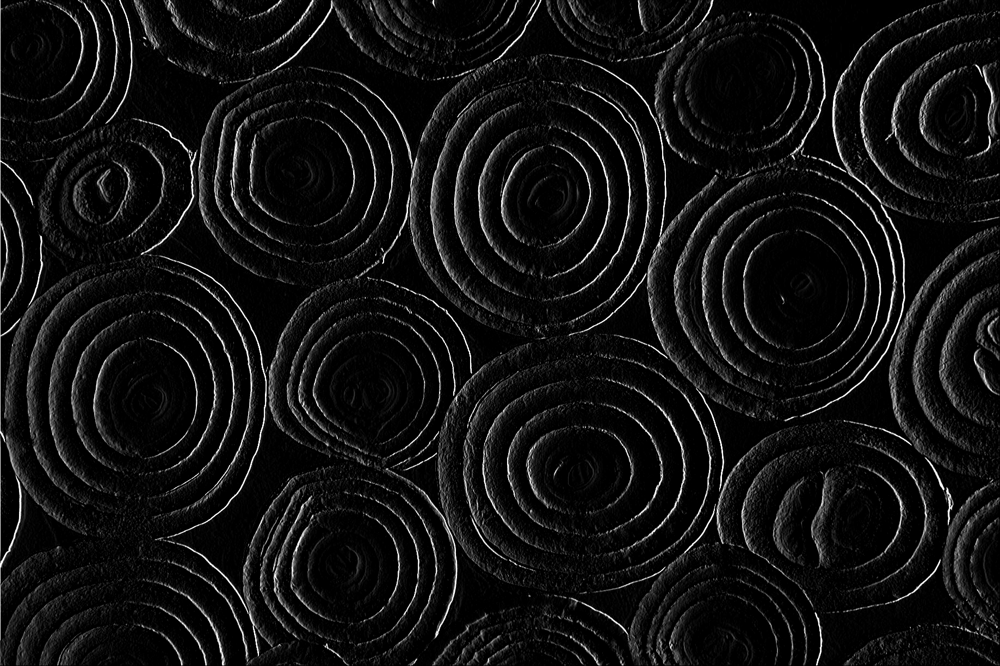

In [38]:
result = conv2D(target_image, lrDiag_filter, 1, 1)

cv2_imshow(result)

In [44]:
filters = [v_filter,h_filter,c_filter_x,rlDiag_filter,lrDiag_filter]
counter = 0
preprocessed_results = []
for image in preprocessed_list_of_images:
  gray = image[:,:,0]
  result = conv2D(gray, filters[counter], 1, 1)
  preprocessed_results.append(result)
  counter += 1

In [51]:
euclidean = []
for i in range(len(preprocessed_results)):
  # print(preprocessed_list_of_images[i].shape)
  print(preprocessed_results[i].shape)
  gray = preprocessed_list_of_images[i][:,:,0]
  print(gray.shape)

  d = np.linalg.norm(preprocessed_results[i] - gray)
  euclidean.append(i)

(225, 225)
(225, 225)
(600, 600)
(600, 600)
(626, 626)
(626, 626)
(1200, 1200)
(1200, 1200)
(162, 312)
(162, 312)


In [52]:
print(euclidean)

[0, 1, 2, 3, 4]


#### Explain Your Results Here: 
the most dominant results are vertical since that has the least euclidean distance value.

